In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
#from hdt_util import ArmadilloV1_feeder
#from forecasters import ArmadilloV1, ArmadilloV2

import numpy as np
import seaborn as sns
import tensorflow as tf
from IPython.display import clear_output
from matplotlib.backends.backend_pdf import PdfPages
import scipy
from scipy.stats import gamma, norm
import datetime
import matplotlib.pyplot as plt
import pandas as pd
import datetime 
import os
import ast
import glob
import covidcast
from collections import defaultdict
from IPython.display import clear_output
%cd ../code

#from preprocess import *
#from utilities import load_files, format_df_normalized, format_density_normalized, plot_column, plot_visitor_fits, plot_density_fits

%cd ..

%cd code
import covidcast
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
import math
import glob
import pandas as pd
from sklearn.linear_model import LinearRegression
from statsmodels.regression import linear_model
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.stats.outliers_influence import variance_inflation_factor
from preprocess import *
from itertools import combinations 
%cd ..

/home/xiavatar/Desktop/hdt/code
/home/xiavatar/Desktop/hdt
/home/xiavatar/Desktop/hdt/code
/home/xiavatar/Desktop/hdt


In [3]:
yolo_cbgs = ['061130101011', '061130101012', '061130101013', \
'061130101014', '061130101021', '061130101022', \
'061130101023', '061130101024', '061130102011', \
'061130102012', '061130102031', '061130102032', \
'061130102033', '061130102034', '061130102041', \
'061130102042', '061130102043', '061130103021', \
'061130103022', '061130103023', '061130103101', \
'061130103102', '061130103103', '061130103121', \
'061130103122', '061130103123', '061130104011', \
'061130104012', '061130104013', '061130104021', \
'061130104022', '061130105011', '061130105012', \
'061130105051', '061130105052', '061130105053', \
'061130105081', '061130105091', '061130105092', \
'061130105101', '061130105102', '061130105103', \
'061130105104', '061130105111', '061130105112', \
'061130105121', '061130105122', '061130105131', \
'061130105132', '061130106021', '061130106022', \
'061130106023', '061130106024', '061130106051', \
'061130106052', '061130106061', '061130106062', \
'061130106063', '061130106064', '061130106065', \
'061130106071', '061130106072', '061130106073', \
'061130106081', '061130106082', '061130106083', \
'061130107011', '061130107012', '061130107013', \
'061130107014', '061130107031', '061130107032', \
'061130107033', '061130107034', '061130107041', \
'061130108001', '061130108002', '061130108003', \
'061130109011', '061130109012', '061130109013', \
'061130109021', '061130109022', '061130109023', \
'061130110011', '061130110012', '061130110013', \
'061130110021', '061130110022', '061130110023', \
'061130111011', '061130111012', '061130111021', \
'061130111022', '061130111031', '061130111032', \
'061130112031', '061130112032', '061130112041', \
'061130112042', '061130112043', '061130112051', \
'061130112052', '061130112053', '061130112054', \
'061130112055', '061130112061', '061130112062', \
'061130112063', '061130113001', '061130113002', \
'061130113003', '061130113004', '061130113005', \
'061130114001', '061130114002', '061130114003', \
'061130115001', '061130115002', '061130115003', \
'061130115004', '061130115005']

# Mobility variable

Because the Safegraph panel is a growing quantity we need to normalize the counts. For a poi we normalize by dividing the unique visitor counts from each home cbg,$n_{c,t,visitors}$, by the number of unique devices whose home device is in that cbg, $n_{c,t,home}$ for that week. This gives an esimate of the number of individuals from that cbg who visited a poi. We then multiply this ratio by the estimated population of the cbg, $p_c$, obtained from the SafeGraph open census data.

Based on CDC guidelines we also note that the risk of transmission is higher when in close contact with people for more than 15 minutes. 

https://www.cdc.gov/coronavirus/2019-ncov/php/public-health-recommendations.html

We penalize for this by adding a factor consisting of a monotonic function $\phi$ evaluated on the median dwell time $t_{dwell}$. This gives us one generic mobility term shown below where $\mathcal{I}_{poi}$ is an index of pois and $\mathcal{C}_{i,t,cbg}$ is a subset of cbgs which had visitors to the poi, $i$, whose home device is in a cbg contained in $\mathcal{C}_{i,t,cbg}$.

$$
m_t = \sum_{i \in \mathcal{I}_{poi}} \sum_{c \in \mathcal{C}_{i,t,cbg}} \frac{n_{c,t,visitors}*p_c*\phi(t_{dwell})}{n_{c,t,home}}
$$

This generic mobility term can then be extended to account for the surface area of the poi which factors in the potential proximity of individuals visiting a poi.

$$
m_t = \sum_{i \in \mathcal{I}_{poi}} \sum_{c \in \mathcal{C}_{i,t,cbg}} \frac{n_{c,t,visitors}*p_c*\phi(t_{dwell})}{A_{i}*n_{c,t,home}}
$$

For our purposes we let $\phi(t) = \sigma(t-15)$ where $\sigma$ is the sigmoid function. This effectively sets the multiplicate factor to $0$ when $t<<15$ and to $1$ when $t>=17$

# Loading data

In [4]:
COLUMNS = [
    'Bakeries and Tortilla Manufacturing',
    'Beer, Wine, and Liquor Stores',
    'Beverage Manufacturing',
    'Book Stores and News Dealers',
    'Child Day Care Services',
    'Clothing Stores',
    'Colleges, Universities, and Professional Schools',
    'Continuing Care Retirement Communities and Assisted Living Facilities for the Elderly',
    'Couriers and Express Delivery Services',
    'Department Stores',
    'Drinking Places (Alcoholic Beverages)',
    'Electric Power Generation, Transmission and Distribution',
    'Electronic and Precision Equipment Repair and Maintenance',
    'Electronics and Appliance Stores',
    'Elementary and Secondary Schools',
    'Florists',
    'General Merchandise Stores, including Warehouse Clubs and Supercenters',
    'Grocery Stores',
    #'Grocery and Related Product Merchant Wholesalers',
    'Home Health Care Services',
    'Junior Colleges',
    'Motion Picture and Video Industries',
    'Nursing Care Facilities (Skilled Nursing Facilities)',
    'Offices of Dentists',
    'Offices of Other Health Practitioners',
    'Offices of Physicians',
    'Offices of Real Estate Agents and Brokers',
    'Office Supplies, Stationery, and Gift Stores',
    'Other Amusement and Recreation Industries',
    'Other Schools and Instruction',
    #'Performing Arts Companies',
    'Postal Service',
    #'Psychiatric and Substance Abuse Hospitals',
    'Religious Organizations',
    'Special Food Services',
    'Specialized Freight Trucking',
    'Specialty (except Psychiatric and Substance Abuse) Hospitals',
    'Specialty Food Stores',
    'Spectator Sports',
    #'Technical and Trade Schools',
    'Warehousing and Storage',
]

In [5]:
df = defaultdict(list)
%cd data
for top_category in COLUMNS:
    dates = pd.date_range('2020-02-20', '2021-02-28').tolist()
    
    cases = pd.read_csv('usafacts_cases.csv',parse_dates=['time_value'])
    cases = cases[cases['time_value'].isin(dates)]
    cases = cases['value'].to_numpy()

    deaths = pd.read_csv('usafacts_deaths.csv',parse_dates=['time_value'])
    deaths = deaths[deaths['time_value'].isin(dates)]
    deaths = deaths['value'].to_numpy()
    
    daily_visitor_df = pd.read_csv(os.path.join('normalized', top_category, 'daily_visitor.csv'),usecols=['date','sum'],parse_dates=True, )
    daily_visitor_df['date'] = pd.to_datetime(daily_visitor_df['date'])
    daily_visitor_df = daily_visitor_df.set_index('date')
    daily_visitor_df = daily_visitor_df.reindex(dates)
    daily_visitor_df = daily_visitor_df.backfill()
    
    visitor_density_df = pd.read_csv(os.path.join('normalized', top_category, 'visitor_density.csv'), usecols=['date','mean','max'])
    visitor_density_df['date'] = pd.to_datetime(visitor_density_df['date'])
    visitor_density_df = visitor_density_df.set_index('date')    
    visitor_density_df = visitor_density_df.reindex(dates)
    visitor_density_df = visitor_density_df.backfill()
    #visitor_density_df = visitor_density_df.interpolate(method="akima",order=3)
    
    df[top_category].append(daily_visitor_df)
    df[top_category].append(visitor_density_df)
    print(top_category)

/home/xiavatar/Desktop/hdt/data
Bakeries and Tortilla Manufacturing
Beer, Wine, and Liquor Stores
Beverage Manufacturing
Book Stores and News Dealers
Child Day Care Services
Clothing Stores
Colleges, Universities, and Professional Schools
Continuing Care Retirement Communities and Assisted Living Facilities for the Elderly
Couriers and Express Delivery Services
Department Stores
Drinking Places (Alcoholic Beverages)
Electric Power Generation, Transmission and Distribution
Electronic and Precision Equipment Repair and Maintenance
Electronics and Appliance Stores
Elementary and Secondary Schools
Florists
General Merchandise Stores, including Warehouse Clubs and Supercenters
Grocery Stores
Home Health Care Services
Junior Colleges
Motion Picture and Video Industries
Nursing Care Facilities (Skilled Nursing Facilities)
Offices of Dentists
Offices of Other Health Practitioners
Offices of Physicians
Offices of Real Estate Agents and Brokers
Office Supplies, Stationery, and Gift Stores
Other 

In [6]:
visitor_df = pd.DataFrame()
density_df = pd.DataFrame()
for top_category in COLUMNS:
    visitor_df[top_category] = df[top_category][0]['sum'].to_list()
    density_df[top_category] = df[top_category][1]['mean'].to_list()

# Correlation plots

In [7]:
visitor_corr = visitor_df.corr('spearman')
density_corr = density_df.corr('spearman')

<AxesSubplot:>

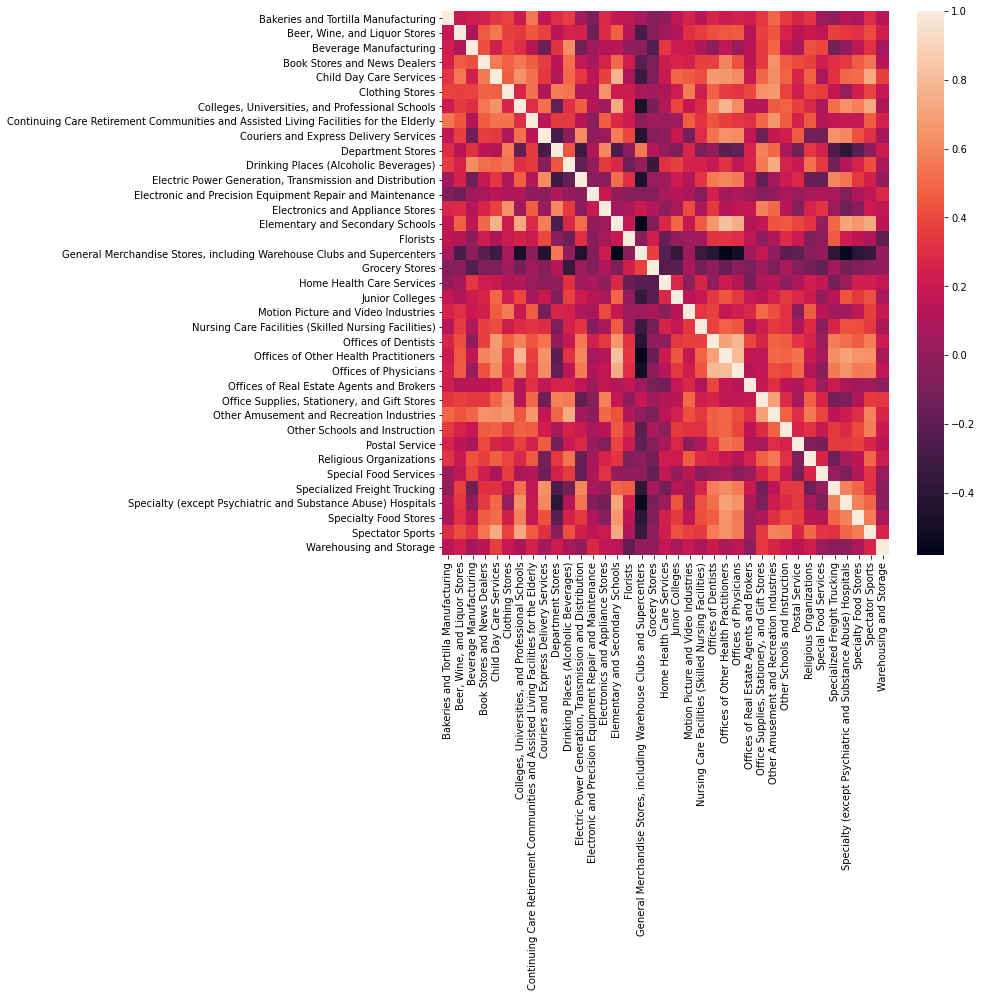

In [8]:
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(visitor_corr, xticklabels=True, yticklabels=True,ax=ax)

<AxesSubplot:ylabel='pair'>

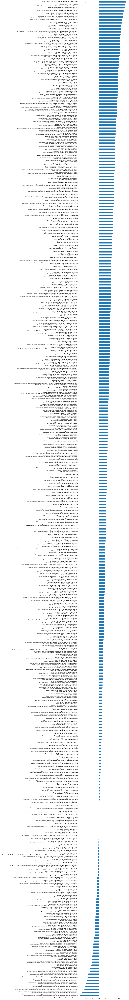

In [9]:
category1 = []
category2 = []

visitor_rank = []
visitor_rank_df = pd.DataFrame()
for i in range(len(visitor_corr)):
    for j in range(i):
        col1 = visitor_corr.columns[i]
        col2 = visitor_corr.columns[j]
        
        category1.append(col1)
        category2.append(col2)        
        rank = visitor_corr[col1][col2]
        visitor_rank.append(rank)
        
visitor_rank_df['category1'] = category1
visitor_rank_df['category2'] = category2
visitor_rank_df['pair'] = '[' + visitor_rank_df['category1'] + '], [' + visitor_rank_df['category2'] + ']'
visitor_rank_df['spearman_corr'] = visitor_rank

visitor_rank_df.sort_values(by='spearman_corr', inplace=True, ascending=True)

visitor_rank_df.plot.barh(x='pair', y='spearman_corr', figsize=(10,200))

<AxesSubplot:>

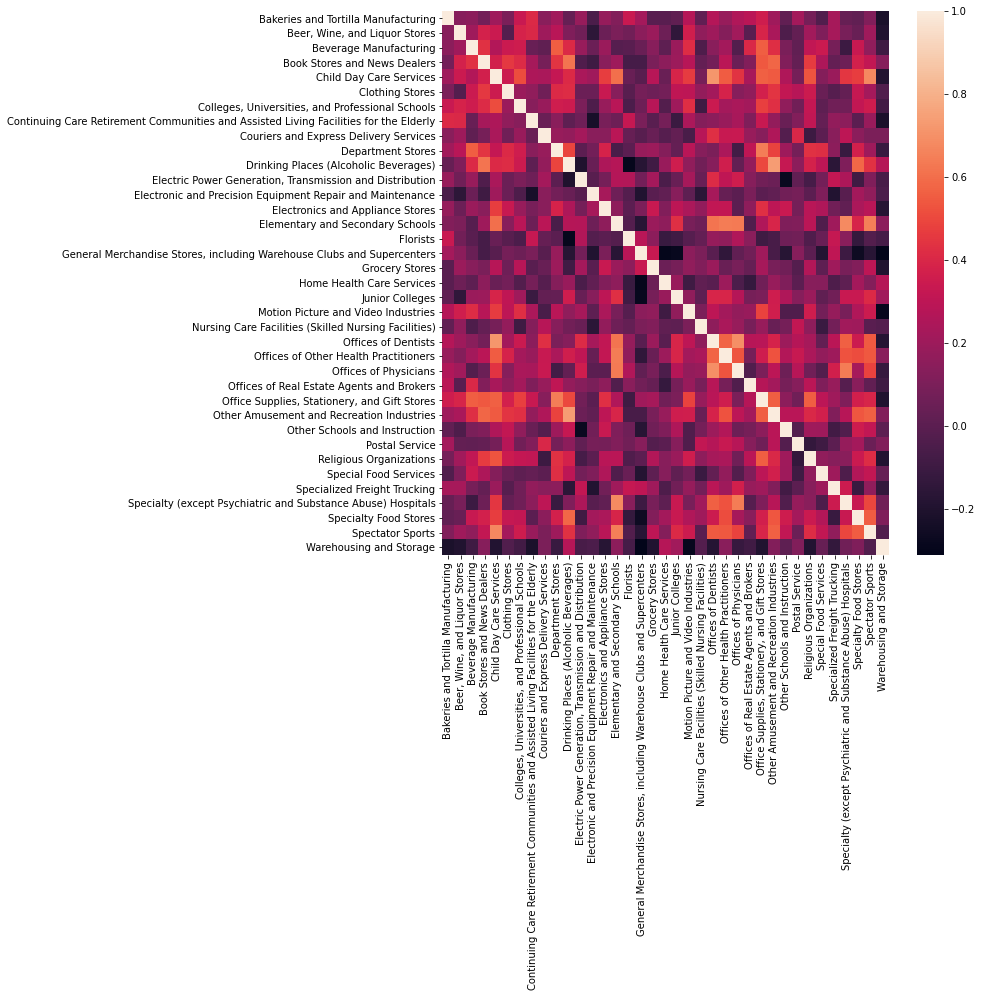

In [10]:
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(density_corr, xticklabels=True, yticklabels=True,ax=ax)

<AxesSubplot:ylabel='pair'>

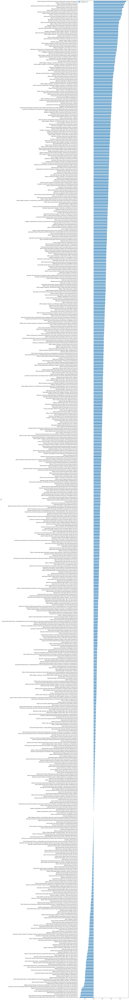

In [11]:
category1 = []
category2 = []

density_rank = []
density_rank_df = pd.DataFrame()
for i in range(len(density_corr)):
    for j in range(i):
        col1 = density_corr.columns[i]
        col2 = density_corr.columns[j]
        
        category1.append(col1)
        category2.append(col2)        
        rank = density_corr[col1][col2]
        density_rank.append(rank)
        
density_rank_df['category1'] = category1
density_rank_df['category2'] = category2
density_rank_df['pair'] = '[' + density_rank_df['category1'] + '], [' + density_rank_df['category2'] + ']'
density_rank_df['spearman_corr'] = density_rank

density_rank_df.sort_values(by='spearman_corr', inplace=True, ascending=True)

density_rank_df.plot.barh(x='pair', y='spearman_corr', figsize=(10,200))

# Interventions

Here is a brief list of interventions whose labels are included in the right most plot.
* 03/18/2020: Shelter in place order Yolo
* 04/02/2020: City of Davis Parks, Exercise Equipment, Sports Courts and Water Fountains Closed
* 04/24/2020: Face covering mandate
* 05/31/2020: Shelter in place ends
* 08/28/2020: Gavin Newsom announced Blueprint for Safer Economy
    * https://www.yolocounty.org/Home/Components/News/News/12210/26?backlist=%2f
* 08/28/2020-09/28/2020: Yolo county is in Purple Tier
    * https://www.yolocounty.org/Home/Components/News/News/12210/26?backlist=%2f
* 09/29/2020-11/16/2020-: Yolo county is in Red Tier
    * https://www.yolocounty.org/Home/Components/News/News/12250/26?backlist=%2f
* 11/17/2020-02/23/2021: Yolo county is in Purple Tier
    * https://www.yolocounty.org/Home/ShowDocument?id=67000
* 2/24/2021-: Yolo county is in Red Tier
    * https://www.yolocounty.org/Home/ShowDocument?id=68429
    
Reference: https://www.cityofdavis.org/city-hall/emergency-information/covid-19-novel-coronavirus-information

The left most plot is using mobility terms computed without the surface area of the POI.

$$
m_t = \sum_{i \in \mathcal{I}_{poi}} \sum_{c \in \mathcal{C}_{i,t,cbg}} \frac{n_{c,t,visitors}*p_c*\phi(t_{dwell})}{n_{c,t,home}}
$$

The middle plot is using mobility terms computed with the surface area of the POI.

$$
m_t = \sum_{i \in \mathcal{I}_{poi}} \sum_{c \in \mathcal{C}_{i,t,cbg}} \frac{n_{c,t,visitors}*p_c*\phi(t_{dwell})}{A_{i}*n_{c,t,home}}
$$

<ipython-input-13-cd7a43810700>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(40,5))


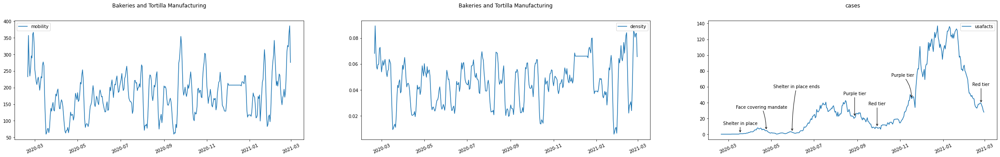

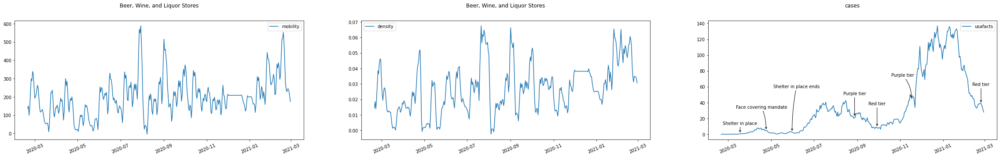

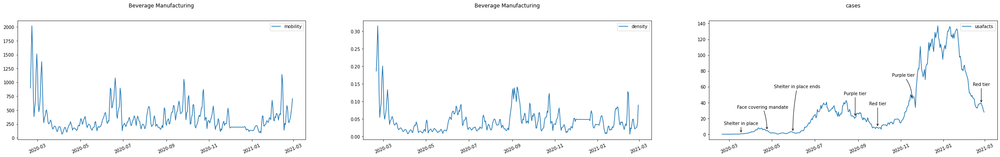

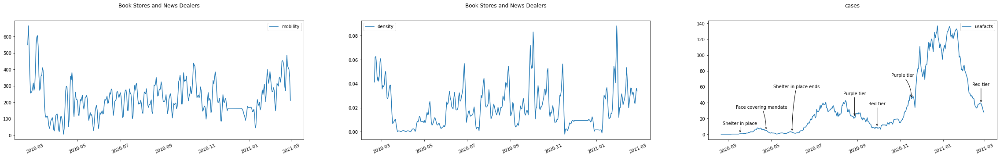

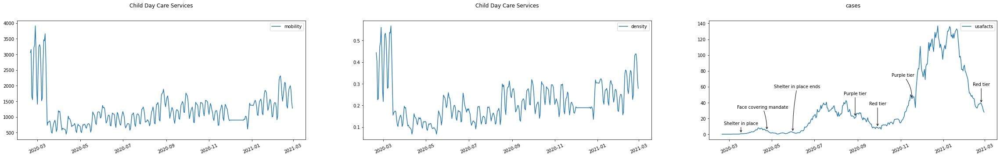

...

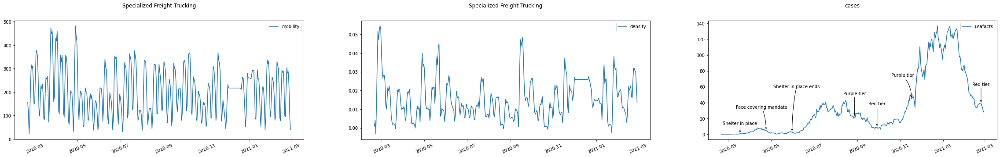

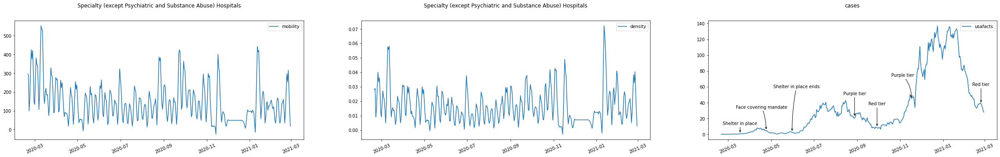

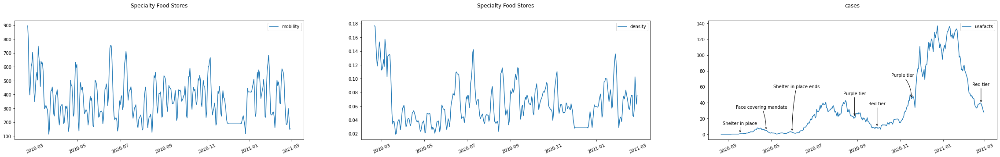

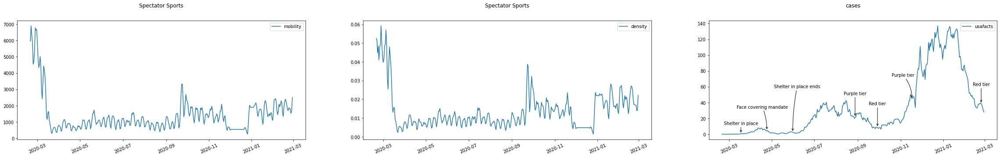

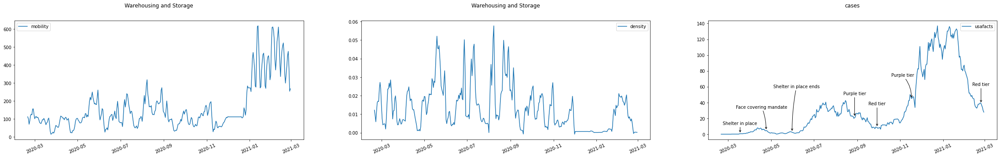

In [13]:
for top_category in COLUMNS:
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(40,5))

    i=0
    ax[i].plot(dates,scipy.signal.savgol_filter(df[top_category][0]['sum'].to_numpy(), 5, 3), label='mobility')
    ax[i].set_title(top_category[:100],pad=30)
    ax[i].tick_params(axis='x',labelrotation=23)
    ax[i].legend()
    
    i=1
    ax[i].plot(dates,scipy.signal.savgol_filter(df[top_category][1]['mean'].to_numpy(), 5, 3), label='density')
    ax[i].set_title(top_category[:100],pad=30)
    ax[i].tick_params(axis='x',labelrotation=23)
    ax[i].legend()
    
    i=2
    ax[i].plot(dates,cases, label='usafacts')
    ax[i].set_title('cases',pad=30)
    ax[i].tick_params(axis='x',labelrotation=23)
    ax[i].annotate(
        "Shelter in place", 
        xy=('2020-03-18', 1),  
        xycoords='data',
        xytext=(0, 20), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->"),
    )
    ax[i].annotate(
        "Face covering mandate", 
        xy=('2020-04-24', 5),  
        xycoords='data',
        xytext=(-10, 50), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3,rad=-0.1"),
    )
    ax[i].annotate(
        "Shelter in place ends", 
        xy=('2020-05-31', 3),  
        xycoords='data',
        xytext=(10, 100), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3,rad=0.05"),
    )
    ax[i].annotate(
        "Purple tier", 
        xy=('2020-08-28', 22),  
        xycoords='data',
        xytext=(0, 50), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->"),
    )
    ax[i].annotate(
        "Red tier", 
        xy=('2020-09-29', 9),  
        xycoords='data',
        xytext=(0, 50), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->"),
    )
    ax[i].annotate(
        "Purple tier", 
        xy=('2020-11-17', 45),  
        xycoords='data',
        xytext=(-20, 50), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3,rad=-0.2"),
    )
    ax[i].annotate(
        "Red tier", 
        xy=('2021-02-24', 39),  
        xycoords='data',
        xytext=(0, 40), 
        textcoords='offset points', 
        ha='center',
        arrowprops=dict(arrowstyle="->"),
    )
    
    ax[i].legend()